In [1]:
import numpy as np
import pandas as pd
import vectorbt as vbt
import quantstats
import talib

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import BernoulliNB
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import classification_report, accuracy_score

In [2]:
dataframe = pd.read_csv("BTCUSD_M1.csv", index_col=0, parse_dates=True)

In [3]:
df = dataframe[["open", "high", "low", "close"]].copy(deep=True)

# ohlc_dict = {"open": "first", "high": "max", "low": "min", "close": "last"}

# df = df.resample("3T").apply(ohlc_dict)

In [99]:
df = df.tail(50000).copy(deep=True)

In [4]:
df

,open,high,low,close
timestamp,,,,
2022-07-01 00:00:00+00:00,19935.5300,19957.1700,19786.4600,19811.0100
2022-07-01 00:01:00+00:00,19785.9200,19828.7900,19753.6800,19806.4000
2022-07-01 00:02:00+00:00,19812.2300,19853.6800,19731.8800,19737.5700
2022-07-01 00:03:00+00:00,19729.8900,19777.3900,19719.0000,19727.9600
2022-07-01 00:04:00+00:00,19719.0600,19729.8200,19662.9900,19681.2400
...,...,...,...,...
2024-06-30 23:52:00+00:00,62741.6800,62741.6800,62741.6800,62741.6800
2024-06-30 23:53:00+00:00,62769.1410,62769.1410,62769.1410,62769.1410
2024-06-30 23:54:00+00:00,62741.4430,62741.4430,62741.4430,62741.4430


In [22]:
timeperiod = 14

df["pct_change"] = df["close"].pct_change()
df["pct_change_15"] = df["close"].pct_change(15)
df["rsi"] = talib.RSI(df["close"], timeperiod=timeperiod)
df["adx"] = talib.ADX(df["high"], df["low"], df["close"], timeperiod=timeperiod)
df["sma"] = talib.SMA(df["close"], timeperiod=timeperiod)
df["sma/close"] = df["sma"] / df["close"]
df["corr"] = df["close"].rolling(timeperiod).corr(df["sma"])
df["volatility"] = df["pct_change"].rolling(timeperiod).std() * 100
df["volatility_2"] = df["pct_change_15"].rolling(timeperiod).std() * 100
df["future_pct_change"] = df["pct_change"].shift(-1)
# df["future_signal"] = np.where(df["future_pct_change"] > 0, 1, 0)
df["future_signal"] = np.where(
    df["future_pct_change"] > 0, 1, np.where(df["future_pct_change"] < 0, -1, 0)
)
df = df.replace([np.inf, -np.inf], np.nan)

inputs = [
    "pct_change",
    "pct_change_15",
    "rsi",
    "adx",
    "sma/close",
    "corr",
    "volatility",
    "volatility_2",
]

output = "future_signal"

model_window = (3 * df.shape[0]) // 4
train_data = df.iloc[:model_window].copy(deep=True)
test_data = df.iloc[model_window:].copy(deep=True)

# model = DecisionTreeClassifier(criterion="gini", max_depth=4, min_samples_leaf=5)
num_estimators = 11
model = RandomForestClassifier(n_estimators=num_estimators, criterion='gini', random_state=0)
model.fit(train_data[inputs], train_data[output])

train_data["forecast"] = model.predict(train_data[inputs])
test_data["forecast"] = model.predict(test_data[inputs])
train_data["signal"] = train_data["forecast"].shift(1)
test_data["signal"] = test_data["forecast"].shift(1)
train_data["signal"].value_counts()

signal
 1.0    339059
-1.0    338239
 0.0      1556
Name: count, dtype: int64

In [23]:
print(classification_report(test_data[output], test_data["forecast"]))
accuracy = accuracy_score(test_data[output], test_data["forecast"], normalize=True) * 100
print(f"Accuracy: {round(accuracy, 2)}%")

              precision    recall  f1-score   support

          -1       0.50      0.50      0.50    112054
           0       0.00      0.00      0.00       239
           1       0.51      0.51      0.51    113993

    accuracy                           0.51    226286
   macro avg       0.34      0.34      0.34    226286
weighted avg       0.51      0.51      0.51    226286

Accuracy: 50.59%


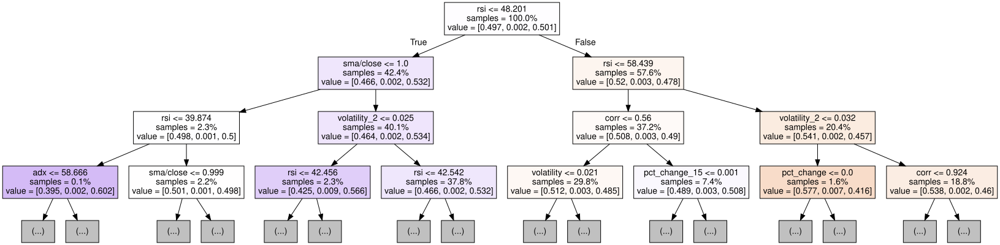

In [24]:
import graphviz
from sklearn import tree

dot_data = tree.export_graphviz(
    model.estimators_[-1],
    out_file=None,
    filled=True,
    feature_names=inputs,
    max_depth=3,
    impurity=False,
    proportion=True,
)
g1 = graphviz.Source(dot_data, format="png")
# g1.render('img')
g1

In [28]:
test_long_entries = test_data["signal"] == 1
test_short_entries = test_data["signal"] == -1

test_long_exits = test_data["signal"].shift(-1) != 1
test_short_exits = test_data["signal"].shift(-1) != -1

test_pf = vbt.Portfolio.from_signals(
    test_data["close"],
    entries=test_long_entries,
    exits=test_long_exits,
    short_entries=test_short_entries,
    short_exits=test_short_exits,
    freq="1min",
    size_granularity=1e-8,
)

test_pf.trades.records

,id,col,size,entry_idx,entry_price,entry_fees,exit_idx,exit_price,exit_fees,pnl,return,direction,status,parent_id
0,0,0,0.002939,3,34021.6300,0.0,19,34025.2600,0.0,0.010670,0.000107,0,1,0
1,1,0,0.002939,19,34025.2600,0.0,21,34034.3500,0.0,-0.026718,-0.000267,1,1,1
2,2,0,0.002938,21,34034.3500,0.0,23,34039.0410,0.0,0.013781,0.000138,0,1,2
3,3,0,0.002938,23,34039.0410,0.0,27,34038.9420,0.0,0.000291,0.000003,1,1,3
4,4,0,0.002938,27,34038.9420,0.0,33,34000.1090,0.0,-0.114082,-0.001141,0,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36707,36707,0,0.007447,226258,62847.4215,0.0,226264,62784.2900,0.0,-0.470148,-0.001005,0,1,36706
36708,36708,0,0.007447,226264,62784.2900,0.0,226273,62823.0100,0.0,-0.288353,-0.000617,1,1,36707
36709,36709,0,0.007438,226273,62823.0100,0.0,226275,62788.3000,0.0,-0.258171,-0.000553,0,1,36708
36710,36710,0,0.007438,226275,62788.3000,0.0,226278,62726.4500,0.0,0.460037,0.000985,1,1,36709


In [29]:
stats = test_pf.stats()
stats

Start                         2023-10-27 07:39:00+00:00
End                           2024-06-30 23:59:00+00:00
Period                                157 days 03:26:00
Start Value                                       100.0
End Value                                    467.054115
Total Return [%]                             367.054115
Benchmark Return [%]                          83.898404
Max Gross Exposure [%]                       100.000354
Total Fees Paid                                     0.0
Max Drawdown [%]                              22.928528
Max Drawdown Duration                  19 days 23:52:00
Total Trades                                      36712
Total Closed Trades                               36711
Total Open Trades                                     1
Open Trade PnL                                -0.422478
Win Rate [%]                                  53.528915
Best Trade [%]                                  6.13737
Worst Trade [%]                               -6

In [30]:
results = {
    "Number of Estimators": num_estimators,
    "Sharpe Ratio": round(stats["Sharpe Ratio"], 2),
    "Excess Return [%]": round(stats["Total Return [%]"] - stats["Benchmark Return [%]"], 2),
    "Win Rate [%]": round(stats["Win Rate [%]"], 2),
    "Accuracy [%]": round(accuracy, 2),
}
results

{'Number of Estimators': 11,
 'Sharpe Ratio': 4.47,
 'Excess Return [%]': 283.16,
 'Win Rate [%]': 53.53,
 'Accuracy [%]': 50.59}

In [16]:
quantstats.reports.html(
    returns=test_pf.value().tz_localize(None).pct_change(),
    benchmark=test_data["close"].tz_localize(None).pct_change(),
    periods_per_year=365 * 24 * 60,
    title="Random Forest on BTCUSD",
)